In [1]:
import pandas as pd
import numpy as np
from math import sin, cos 

# exploratory analysis
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
from io import BytesIO
from PIL import Image

# Important NOTE: Use opencv >=4.4 
import cv2

In [2]:
# Replace 'your_file.parquet' with the path to your Parquet file
df1 = pd.read_parquet('image_datafiles/train-00000-of-00002-e4d6fc738e93e6d4.parquet')
df2 = pd.read_parquet('image_datafiles/train-00001-of-00002-e9a101e26bed902f.parquet')
df = pd.concat([df1, df2], axis=0, ignore_index=True)

In [3]:
image_bytes = BytesIO(df.image[0]['bytes'])
img = Image.open(image_bytes)
imgar = np.array(img)
imgar[10][10]

array([89, 87, 62], dtype=uint8)

In [4]:
def extract_N_in_each_category(df, N):
    img_array = []
    count = 0
    last_row_label = -1
    for index, row in df.iterrows():
        #print(index, type(row.image['bytes']), row.label)
        if row.label == last_row_label:
            if count >= N:
                continue
        else:
            last_row_label = row.label
            print(f"Label: {row.label} Image: {row.image['path']}")
            count = 0

        image_bytes = BytesIO(row.image['bytes'])
        img = Image.open(image_bytes)
        img_array.append(np.array(img))
        count += 1
        #plt.imshow(img)
        #plt.axis('off')  # Hide axis
        #plt.show()
    return img_array

In [5]:
def save_img_array_to_combojpg_file(img_array, N):
    separation = 8
    ht_of_pic = len(img_array)//N
    
    # Convert each NumPy array to a PIL Image
    pil_images = [Image.fromarray((image * 1).astype(np.uint8)) for image in img_array]

    # Create a new blank image with the same width and total height as the input images
    total_height = sum(img.height for img in pil_images)
    total_height = int(total_height/N)+(ht_of_pic*8)

    max_width = max(img.width for img in pil_images)

    #print(total_height, max_width)
    new_image = Image.new('RGB', (max_width * N, total_height))

    # Paste each image into the new blank image
    y_offset = 0#
    x_offset = 0
    for img in pil_images:
        # print(x_offset, y_offset)
        new_image.paste(img, (x_offset, y_offset))
        x_offset += max_width + separation
        if x_offset >= max_width*N:
            x_offset = 0
            y_offset += img.height + separation


    # Save the new image as a JPEG file
    new_image.save('combined_images.png', quality=95)

In [6]:
def extract_key_points(img_array, N):
    # Convert each NumPy array to a PIL Image
    # pil_images = [Image.fromarray((image * 1).astype(np.uint8)) for image in img_array]
    for img in img_array:
        # Converting image to grayscale
        gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Applying SIFT detector
        sift = cv2.SIFT_create()
        kp = sift.detect(gray, None)

        # Marking the keypoint on the image using circles
        img=cv2.drawKeypoints(gray ,
                                kp ,
                                img ,
                                flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

        plt.imshow(img)
        plt.axis('off')  # Hide axis
        plt.show()

        #cv2.imwrite('image-with-keypoints.jpg', img)


Label: 0 Image: airplane001.jpg
Label: 1 Image: baseballfield001.jpg
Label: 2 Image: basketballcourt001.jpg
Label: 3 Image: beach001.jpg
Label: 4 Image: bridge001.jpg
Label: 5 Image: cemetery001.jpg
Label: 6 Image: chaparral001.jpg
Label: 7 Image: christmastreefarm001.jpg
Label: 8 Image: closedroad001.jpg
Label: 9 Image: coastalmansion001.jpg
Label: 10 Image: crosswalk001.jpg
Label: 11 Image: denseresidential001.jpg
Label: 12 Image: ferryterminal001.jpg
Label: 13 Image: footballfield001.jpg
Label: 14 Image: forest001.jpg
Label: 15 Image: freeway001.jpg
Label: 16 Image: golfcourse001.jpg
Label: 17 Image: harbor001.jpg
Label: 18 Image: intersection001.jpg
Label: 19 Image: mobilehomepark001.jpg
Label: 20 Image: nursinghome001.jpg
Label: 21 Image: oilgasfield001.jpg
Label: 22 Image: oilwell001.jpg
Label: 23 Image: overpass001.jpg
Label: 24 Image: parkinglot001.jpg
Label: 25 Image: parkingspace001.jpg
Label: 26 Image: railway001.jpg
Label: 27 Image: river001.jpg
Label: 28 Image: runway001.j

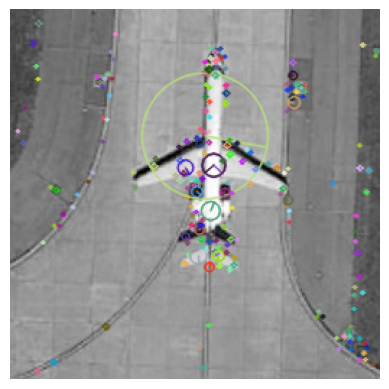

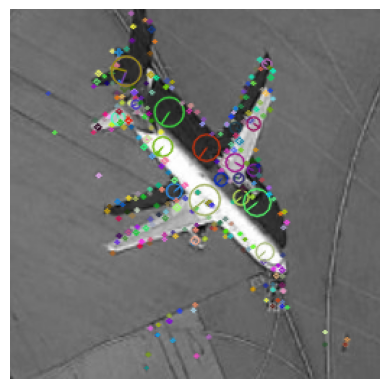

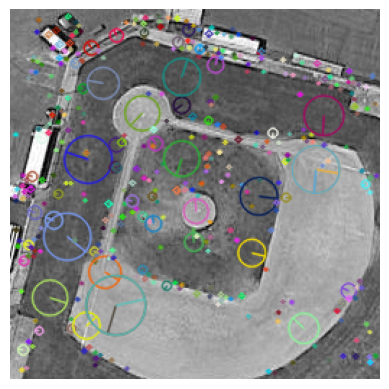

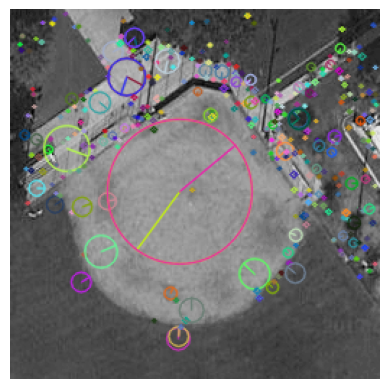

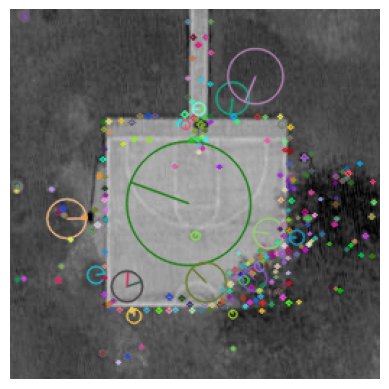

...

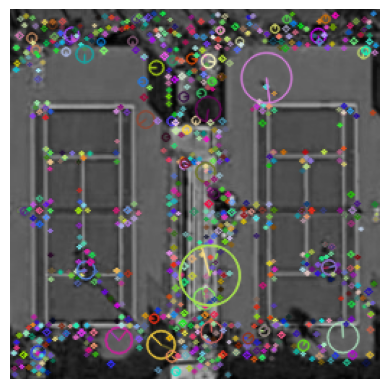

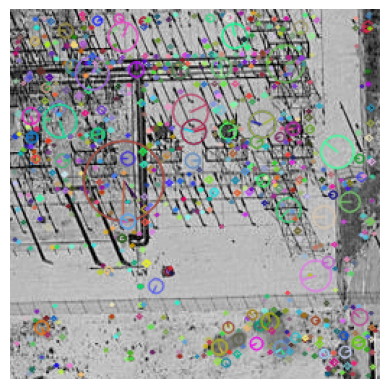

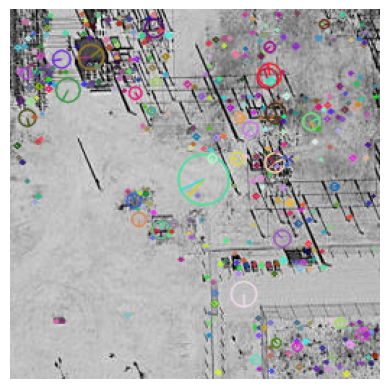

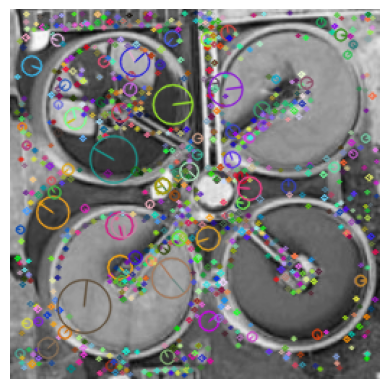

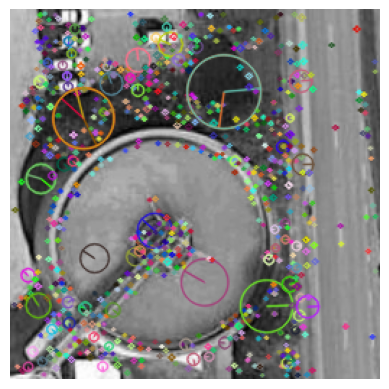

In [7]:
N = 2
img_array = extract_N_in_each_category(df, N)
save_img_array_to_combojpg_file(img_array, N)
extract_key_points(img_array, N)